In [1]:

# @hidden_cell
# The project token is an authorization token that is used to access project resources like data sources, connections, and used by platform APIs.
from project_lib import Project

pc = project.project_context


### Import libraries

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import requests # library to handle requests

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import seaborn as sns

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    branca-0.4.0               |             py_0          26 KB  conda-forge
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    altair-4.0.1               |             py_0         575 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.0 MB

The following NEW packages will be 

### Load Property Data for Jan-2020 
#### Source: http://hkdata.centanet.com/BigData/hong-kong?field=T_POP&sort=default

In [3]:
property_file = project.get_file("Property_Statistics_Jan20.xlsx")
property_raw_data=pd.read_excel(property_file)
property_raw_data.dtypes

District                                object
Total_stock-units                       object
Total_saleable_area-thousand-s.f.       object
Average_building_age-years               int64
Average_saleable_area_of_units-s.f.      int64
Pre-1970 Num of Building                 int64
1970-79 Num of Building                  int64
1980-89 Num of Building                  int64
1990-99 Num of Building                  int64
2000-09 Num of Building                  int64
Post-2009 Num of Building                int64
Pre-1970 %                             float64
1970-79 %                              float64
1980-89 %                              float64
1990-99 %                              float64
2000-09 %                              float64
Post-2009 %                            float64
Sales-Transaction volume                 int64
Sales-Transaction amount-in-billion    float64
Sales-Transaction area-s.f.             object
Sales-Average unit price-HKpers.f.      object
Sales-Turnove

In [4]:
property_raw_data.head()

,District,Total_stock-units,Total_saleable_area-thousand-s.f.,Average_building_age-years,Average_saleable_area_of_units-s.f.,Pre-1970 Num of Building,1970-79 Num of Building,1980-89 Num of Building,1990-99 Num of Building,2000-09 Num of Building,Post-2009 Num of Building,Pre-1970 %,1970-79 %,1980-89 %,1990-99 %,2000-09 %,Post-2009 %,Sales-Transaction volume,Sales-Transaction amount-in-billion,Sales-Transaction area-s.f.,Sales-Average unit price-HKpers.f.,Sales-Turnover rate
0,CENTRAL & WESTERN,"98,448","6,718.8",35,683,15848,21334,23909,20736,10482,6139,0.161,0.217,0.243,0.211,0.106,0.062,103,1.52,"66,612","18,981",0.001
1,WAN CHAI,"66,928","4,676.6",41,699,23446,16576,12942,5894,4136,3934,0.350,0.248,0.193,0.088,0.062,0.059,80,0.85,"47,777","17,590",0.001
2,EASTERN,"124,437","7,257",37,583,19964,30501,51082,8279,9063,5548,0.160,0.245,0.410,0.067,0.073,0.045,165,1.43,"85,005","16,799",0.001
3,SOUTHERN,"42,434","3,969.2",32,935,1945,10088,10378,13360,4837,1826,0.046,0.238,0.245,0.315,0.114,0.043,61,0.66,"36,911","16,400",0.001
4,YAU TSIM MONG,"113,002","6,171",39,546,45150,20175,9390,4274,26931,7082,0.400,0.179,0.083,0.038,0.238,0.063,148,1.03,"66,181","15,906",0.001


### Only keep the data required and correct the data format of Property Data

In [6]:
# Extract required data
columns = ['District','Sales-Average unit price-HKpers.f.','Average_building_age-years']
property_data = pd.DataFrame(property_raw_data, columns=columns)
# Correct data format from object to float
property_data['Sales-Average unit price-HKpers.f.'] = property_data['Sales-Average unit price-HKpers.f.'].str.replace(',','').astype(int)
property_data.head()

,District,Sales-Average unit price-HKpers.f.,Average_building_age-years
0,CENTRAL & WESTERN,18981,35
1,WAN CHAI,17590,41
2,EASTERN,16799,37
3,SOUTHERN,16400,32
4,YAU TSIM MONG,15906,39


### Add 3 building age tiers according to the percentage number of buildings in the age range

In [7]:
property_data['Over 40 years'] = property_raw_data['Pre-1970 %'] + property_raw_data['1970-79 %']
property_data['20 - 40 years'] = property_raw_data['1980-89 %'] + property_raw_data['1990-99 %']
property_data['Below 20 years'] = property_raw_data['2000-09 %'] + property_raw_data['Post-2009 %']
property_data.head()

,District,Sales-Average unit price-HKpers.f.,Average_building_age-years,Over 40 years,20 - 40 years,Below 20 years
0,CENTRAL & WESTERN,18981,35,0.378,0.454,0.168
1,WAN CHAI,17590,41,0.598,0.281,0.121
2,EASTERN,16799,37,0.405,0.477,0.118
3,SOUTHERN,16400,32,0.284,0.560,0.157
4,YAU TSIM MONG,15906,39,0.579,0.121,0.301


### Find the building age group with the highest percentage

In [13]:
# Create a function to retrieve the top builing age tier name in descending order of frequency of occurrence per district
def return_top_age_group(row):
    row_cat_sorted = row.sort_values(ascending=False)
    
    return row_cat_sorted.index.values[0]

In [16]:
# Find the top building age group
property_data['Top building age group']=''
for ind in np.arange(18):
    property_data.iloc[ind,6] = return_top_age_group(property_data.iloc[ind,3:6])
    
property_data.head()

,District,Sales-Average unit price-HKpers.f.,Average_building_age-years,Over 40 years,20 - 40 years,Below 20 years,Top building age group
0,CENTRAL & WESTERN,18981,35,0.378,0.454,0.168,20 - 40 years
1,WAN CHAI,17590,41,0.598,0.281,0.121,Over 40 years
2,EASTERN,16799,37,0.405,0.477,0.118,20 - 40 years
3,SOUTHERN,16400,32,0.284,0.560,0.157,20 - 40 years
4,YAU TSIM MONG,15906,39,0.579,0.121,0.301,Over 40 years


### Load the geoJSON file for 18 districts of Hong Kong
#### Source: http://opendata.esrichina.hk/datasets/hong-kong-18-districts

In [17]:
!wget --quiet https://opendata.arcgis.com/datasets/eea8ff2f12b145f7b33c4eef4f045513_0.geojson
hk_geo = r'eea8ff2f12b145f7b33c4eef4f045513_0.geojson' # geojson file

with open(hk_geo) as json_data:
    hk_geodata = json.load(json_data) # parse file


### Choropleth map based on the average unit price per square feet in HK Dollars from the property sales transaction data Jan-2020

In [18]:
hk_lat = 22.28552 #Hong Kong's latitude, info from https://latitudelongitude.org/hk/hong-kong/
hk_long = 114.15769 #Hong Kong's longitude, info from https://latitudelongitude.org/hk/hong-kong/
hk_map = folium.Map(location=[hk_lat, hk_long], zoom_start=10.5, tiles='Mapbox Bright')

In [19]:
hk_map.choropleth(
    geo_data=hk_geo,
    data=property_data,
    columns=['District','Sales-Average unit price-HKpers.f.'],
    key_on='feature.properties.ENAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average sales unit price(in HKD$) per square feet'
)
hk_map


### Retrieve the coordinate for the 18 districts

#### Source: http://www.hkgisa.org.hk/hong-kong-gis-resources

In [20]:
#Retrieve the coordinate for the 18 districts
coordinate_file = project.get_file("Hong_Kong_18_Districts_Coordinates.xlsx")
coord_df=pd.read_excel(coordinate_file)
coord_df.head()

,ID,District,Lat,Long
0,1,WONG TAI SIN,22.333611,114.196944
1,2,KWAI TSING,22.353611,114.106389
2,3,SHAM SHUI PO,22.330833,114.162222
3,4,YAU TSIM MONG,22.321389,114.172500
4,5,KOWLOON CITY,22.328333,114.191667


### Explore nearby venues for the 18 districts in HK using Foursquare
#### Source: https://foursquare.com/developers/apps/

In [21]:
#CLIENT_ID = 'your-client-ID' # your Foursquare ID
CLIENT_ID = 
#CLIENT_SECRET = 'your-client-secret' # your Foursquare Secret
CLIENT_SECRET = 
VERSION = '20200201' # Foursquare API version

LIMIT = 100
radius = 800


In [22]:
# Function to retrieve the venues, latitudes, longtitudes and venue categories from Foursquare for each district
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['District', 
                  'District Latitude', 
                  'District Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [23]:
hk_districts_venues = getNearbyVenues(names=coord_df['District'],
                                   latitudes=coord_df['Lat'],
                                   longitudes=coord_df['Long']
                                  )

WONG TAI SIN
KWAI TSING
SHAM SHUI PO
YAU TSIM MONG
KOWLOON CITY
KWUN TONG
SAI KUNG
TAI PO
SHA TIN
NORTH
CENTRAL & WESTERN
WAN CHAI
EASTERN
TUEN MUN
YUEN LONG
TSUEN WAN
ISLANDS
SOUTHERN


In [24]:
print(hk_districts_venues.shape)
hk_districts_venues.head()

(781, 7)


,District,District Latitude,District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,WONG TAI SIN,22.333611,114.196944,英記美點小食,22.334636,114.196827,Asian Restaurant
1,WONG TAI SIN,22.333611,114.196944,Just Climb Bouldering Gym,22.334145,114.199200,Climbing Gym
2,WONG TAI SIN,22.333611,114.196944,Starbucks (星巴克),22.334026,114.197196,Coffee Shop
3,WONG TAI SIN,22.333611,114.196944,"Pentahotel Hong Kong, Kowloon (香港九龍貝爾特酒店)",22.337191,114.199625,Hotel
4,WONG TAI SIN,22.333611,114.196944,Yata Supermarket (一田超市),22.333312,114.196586,Supermarket


In [54]:
venue_count = hk_districts_venues.groupby('District')[['Venue']].count()
venue_count.reset_index(inplace=True)
venue_count

,District,Venue
0,CENTRAL & WESTERN,100
1,EASTERN,42
2,ISLANDS,25
3,KOWLOON CITY,66
4,KWAI TSING,29
5,KWUN TONG,63
6,NORTH,17
7,SAI KUNG,52
8,SHA TIN,33
9,SHAM SHUI PO,44


In [26]:
# Number of unique venue category found
len(hk_districts_venues['Venue Category'].unique())

156

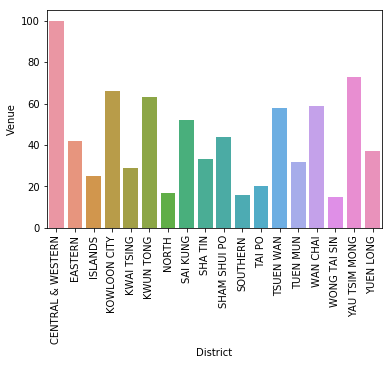

In [59]:
#Bar chart showing venue count per district
barchart = sns.barplot(x='District',y='Venue',data=venue_count)
barchart.set_xticklabels(barchart.get_xticklabels(),rotation=90)
barchart

### Sorting top 10 venues categories in descending order for each district

In [27]:
# One hot encoding
hk_onehot=pd.get_dummies(hk_districts_venues[['Venue Category']],prefix="",prefix_sep="")
first_column = hk_districts_venues['District']
hk_onehot = pd.concat([first_column, hk_onehot], axis=1)
hk_onehot.head()

,District,Airport Service,American Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,BBQ Joint,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Betting Shop,Bookstore,Bowling Alley,Bubble Tea Shop,Building,Burger Joint,Bus Station,Bus Stop,Cable Car,Café,Cantonese Restaurant,Cha Chaan Teng,Chinese Breakfast Place,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Donburi Restaurant,Dumpling Restaurant,Electronics Store,English Restaurant,Exhibit,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food Court,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gastropub,German Restaurant,Gift Shop,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Halal Restaurant,History Museum,Hobby Shop,Hong Kong Restaurant,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Korean Restaurant,Lebanese Restaurant,Light Rail Station,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Metro Station,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Multiplex,Music Store,New American Restaurant,Noodle House,Outdoor Supply Store,Paintball Field,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pharmacy,Pier,Pizza Place,Plaza,Pool,Pub,Ramen Restaurant,Rest Area,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shopping Mall,Shopping Plaza,Snack Place,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Temple,Tennis Court,Thai Restaurant,Toy / Game Store,Track Stadium,Trail,Train Station,Tree,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Yoga Studio,Yunnan Restaurant,Zoo
0,WONG TAI SIN,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,WONG TAI SIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,WONG TAI SIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,WONG TAI SIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,WONG TAI SIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [28]:
hk_onehot.shape

(781, 157)

In [29]:
# Calculating the frequency of occurrence for each venue category per district
hk_18districts = hk_onehot.groupby('District').mean().reset_index()
hk_18districts.head()

,District,Airport Service,American Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,BBQ Joint,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Betting Shop,Bookstore,Bowling Alley,Bubble Tea Shop,Building,Burger Joint,Bus Station,Bus Stop,Cable Car,Café,Cantonese Restaurant,Cha Chaan Teng,Chinese Breakfast Place,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Donburi Restaurant,Dumpling Restaurant,Electronics Store,English Restaurant,Exhibit,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food Court,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gastropub,German Restaurant,Gift Shop,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Halal Restaurant,History Museum,Hobby Shop,Hong Kong Restaurant,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Korean Restaurant,Lebanese Restaurant,Light Rail Station,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Metro Station,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Multiplex,Music Store,New American Restaurant,Noodle House,Outdoor Supply Store,Paintball Field,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pharmacy,Pier,Pizza Place,Plaza,Pool,Pub,Ramen Restaurant,Rest Area,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shopping Mall,Shopping Plaza,Snack Place,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Temple,Tennis Court,Thai Restaurant,Toy / Game Store,Track Stadium,Trail,Train Station,Tree,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Yoga Studio,Yunnan Restaurant,Zoo
0,CENTRAL & WESTERN,0.01,0.0,0.01000,0.01,0.020000,0.0,0.010000,0.010000,0.0,0.02,0.0,0.01,0.01,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.0,0.00,0.040000,0.010000,0.000000,0.010000,0.040000,0.01,0.0,0.0,0.03,0.060000,0.000000,0.01,0.01,0.00000,0.0,0.010000,0.0,0.000000,0.010000,0.0,0.01,0.0,0.01,0.01,0.01,0.0,0.00000,0.000000,0.0,0.0,0.0,0.0,0.030000,0.01000,0.01,0.0,0.0,0.00,0.000000,0.01000,0.02000,0.0,0.000000,0.0,0.0,0.010000,0.0,0.0,0.040000,0.02,0.000000,0.000000,0.010000,0.01,0.0,0.0,0.050000,0.0,0.01,0.01000,0.01,0.0,0.01,0.000000,0.000000,0.01,0.01,0.01,0.0,0.01,0.02,0.00,0.01,0.000000,0.00000,0.010000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.01,0.0,0.000000,0.00000,0.00,0.000000,0.000000,0.00000,0.000000,0.000000,0.02000,0.01,0.02000,0.01,0.000000,0.0,0.01000,0.010000,0.0,0.02,0.01,0.0,0.01,0.0,0.0,0.0,0.0,0.0,0.020000,0.02000,0.0,0.000000,0.0,0.00,0.0,0.0,0.010000,0.0,0.000000,0.00,0.0,0.00,0.01000,0.000000,0.000000,0.04,0.02,0.02000,0.0,0.0
1,EASTERN,0.00,0.0,0.02381,0.00,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.02381,0.0,0.000000,0.0,0.00,0.071429,0.023810,0.023810,0.000000,0.071429,0.00,0.0,0.0,0.00,0.142857,0.000000,0.00,0.00,0.02381,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.02381,0.000000,0.0,0.0,0.0,0.0,0.047619,0.02381,0.00,0.0,0.0,0.00,0.000000,0.02381,0.02381,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.0,0.0,0.095238,0.0,0.00,0.02381,0.00,0.0,0.00,0.000000,0.000000,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.000000,0.02381,0.000000,0.0,0.0,0.0,0.023810,0.000000,0.0,0.0,0.00,0.0,0.000000,0.02381,0.00,0.000000,0.000000,0.02381,0.000000,0.000000,0.02381,0.00,0.02381,0.00,0.023810,0.0,0.02381,0.

In [30]:
hk_18districts.shape

(18, 157)

### Features for k-mean Clustering

In [31]:
X = hk_18districts.values[:,1:]
X

array([[0.01, 0.0, 0.01, ..., 0.02, 0.0, 0.0],
       [0.0, 0.0, 0.023809523809523808, ..., 0.023809523809523808, 0.0,
        0.0],
       [0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0],
       ...,
       [0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0],
       [0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0],
       [0.0, 0.02702702702702703, 0.0, ..., 0.0, 0.0, 0.0]], dtype=object)

### Determine the best k

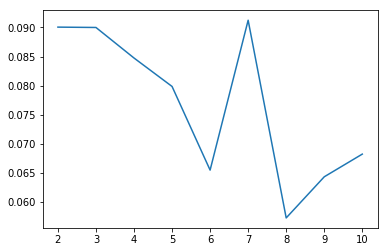

In [34]:
#Determine the best k using silhouette score
from sklearn.metrics import silhouette_score

sil = []
kmax = 10


for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(X)
  labels = kmeans.labels_
  sil.append(silhouette_score(X, labels, metric = 'euclidean'))

Xk_sil = np.arange(2,11)
kgraph_sil = sns.lineplot(Xk_sil,sil)
kgraph_sil

### The best k is TO_BE_CONFIRMED

In [36]:
#X = hk_18districts.values[:,1:]
k_clusters = 7
kmeans = KMeans(n_clusters=k_clusters,random_state=0).fit(X)
kmeans.labels_[0:10]

array([0, 0, 5, 2, 3, 0, 4, 0, 3, 1], dtype=int32)

### Combine the DataFrame with the Top 10 Venue Categories, Average Unit Price, Average Building Age and Cluster Labels

In [37]:
# Create a function to retrieve the venue category names in descending order of frequency of occurrence per district
def return_most_common_venues(row,num_top_venues):
    row_cat = row.iloc[1:]
    row_cat_sorted = row_cat.sort_values(ascending=False)
    
    return row_cat_sorted.index.values[0:num_top_venues]

In [38]:
# Creating a DataFrame storing the top 10 venue categories in descending order of frequency of occurrence
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['District']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

hk_18districts_sorted = pd.DataFrame(columns=columns)
hk_18districts_sorted['District'] = hk_18districts['District']

for ind in np.arange(hk_18districts.shape[0]):
    hk_18districts_sorted.iloc[ind,1:] = return_most_common_venues(hk_18districts.iloc[ind,:],num_top_venues)

hk_18districts_sorted.head()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,CENTRAL & WESTERN,Coffee Shop,Japanese Restaurant,Chinese Restaurant,Café,Wine Bar,Hotel,French Restaurant,Cocktail Bar,Gym / Fitness Center,Yoga Studio
1,EASTERN,Coffee Shop,Japanese Restaurant,Chinese Restaurant,Café,French Restaurant,Park,Sushi Restaurant,Fried Chicken Joint,Ramen Restaurant,Building
2,ISLANDS,Dessert Shop,Chinese Restaurant,Vegetarian / Vegan Restaurant,Tea Room,Cable Car,Middle Eastern Restaurant,Bus Station,Noodle House,Market,Sandwich Place
3,KOWLOON CITY,Thai Restaurant,Dessert Shop,Chinese Restaurant,Coffee Shop,Café,Halal Restaurant,Noodle House,Cha Chaan Teng,Seafood Restaurant,Fast Food Restaurant
4,KWAI TSING,Bus Station,Chinese Restaurant,Convenience Store,Dessert Shop,Hong Kong Restaurant,Taiwanese Restaurant,Rest Area,Fast Food Restaurant,Cha Chaan Teng,Cantonese Restaurant


In [39]:
# Combine the Average unit price, average building age and cluster labels the data frame created above
hk_18districts_sorted.insert(0,'Average unit price',property_data['Sales-Average unit price-HKpers.f.'])
hk_18districts_sorted.insert(0,'Top building age group',property_data['Top building age group'])
hk_18districts_sorted.insert(0,'Average building age',property_data['Average_building_age-years'])
hk_18districts_sorted.insert(0,'Cluster Labels',kmeans.labels_)
hk_results = coord_df
hk_results = hk_results.join(hk_18districts_sorted.set_index('District'),on='District')
hk_results

,ID,District,Lat,Long,Cluster Labels,Average building age,Top building age group,Average unit price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,WONG TAI SIN,22.333611,114.196944,2,26,20 - 40 years,12020,Pizza Place,Thai Restaurant,Cha Chaan Teng,Diner,Supermarket,Noodle House,Chinese Restaurant,Climbing Gym,Paintball Field,Coffee Shop
1,2,KWAI TSING,22.353611,114.106389,3,39,Over 40 years,15906,Bus Station,Chinese Restaurant,Convenience Store,Dessert Shop,Hong Kong Restaurant,Taiwanese Restaurant,Rest Area,Fast Food Restaurant,Cha Chaan Teng,Cantonese Restaurant
2,3,SHAM SHUI PO,22.330833,114.162222,1,15,Below 20 years,15223,Noodle House,Chinese Restaurant,Dessert Shop,Dumpling Restaurant,Hong Kong Restaurant,Italian Restaurant,Snack Place,Shopping Mall,Fast Food Restaurant,Cha Chaan Teng
3,4,YAU TSIM MONG,22.321389,114.172500,0,24,20 - 40 years,12062,Coffee Shop,Noodle House,Cha Chaan Teng,Dessert Shop,Chinese Restaurant,Market,Cantonese Restaurant,Steakhouse,Beer Bar,Flower Shop
4,5,KOWLOON CITY,22.328333,114.191667,2,32,20 - 40 years,16400,Thai Restaurant,Dessert Shop,Chinese Restaurant,Coffee Shop,Café,Halal Restaurant,Noodle House,Cha Chaan Teng,Seafood Restaurant,Fast Food Restaurant
5,6,KWUN TONG,22.313333,114.225833,0,37,Over 40 years,14720,Chinese Restaurant,Coffee Shop,Café,Japanese Restaurant,Cantonese Restaurant,Hong Kong Restaurant,Department Store,Sushi Restaurant,Fast Food Restaurant,Restaurant
6,7,SAI KUNG,22.381389,114.270556,0,33,Over 40 years,13845,Seafood Restaurant,Café,Thai Restaurant,Pub,Pizza Place,Coffee Shop,Restaurant,Italian Restaurant,Burger Joint,Dessert Shop
7,8,TAI PO,22.447587,114.164341,1,27,20 - 40 years,13070,Noodle House,Cha Chaan Teng,Chinese Restaurant,Pub,Dumpling Restaurant,Dessert Shop,Snack Place,Fast Food Restaurant,Market,Coffee Shop
8,9,SHA TIN,22.373419,114.182831,3,39,20 - 40 years,14218,Bus Stop,Hong Kong Restaurant,Chinese Restaurant,Cantonese Restaurant,Bus Station,Korean Restaurant,Fast Food Restaurant,Italian Restaurant,Asian Restaurant,Restaurant
9,10,NORTH,22.504498,114.126779,4,36,Over 40 years,14454,Athletics & Sports,Chinese Restaurant,Fast Food Restaurant,Food Court,Seafood Restaurant,Betting Shop,Gym / Fitness Center,Shopping Mall,Cantonese Restaurant,Coffee Shop


### Visualize the results

In [45]:
x = np.arange(k_clusters)
ys = [i+x+(i*x)**2 for i in range(k_clusters)]
colors_array = cm.rainbow(np.linspace(0,1,len(ys)))
rainbow=[colors.rgb2hex(i) for i in colors_array]

In [46]:
markers_colors = []
for lat, long, poi, cluster, age in zip(hk_results['Lat'],hk_results['Long'],hk_results['District'],hk_results['Cluster Labels'],hk_results['Top building age group']):
    label = folium.Popup(str(poi) + '-Cluster:' + str(cluster) + '-Top Building Age Group: '+str(age),parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius = 3,
        popup=label,
        color=rainbow[cluster-1],
        fill = True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(hk_map)


In [47]:
hk_map